**2024.08.21 - AI Machine Learning Capstone Project**

Topic: Lifestyle & Obesity

Objective(s): To see if there are lifestyle patterns linking to obesity.

**Data Extraction & Wrangling Phase**

In [4]:
# Importing the required libraries
import pandas as pd
import numpy as np

# To ignore the warnings that may appear
import warnings
warnings.filterwarnings("ignore")

print("Libraries imported successfully!")

Libraries imported successfully!


The following dataset is for estimation of obesity levels based on eating habits and physical condition in individuals from Colombia, Peru and Mexico.

As biology shouldn't have too much ethnic biasness, it should be relevant regardless of country or region.

In [6]:
# Retrieve Data from CSV files
dataURL = "ObesityDataSet_raw_and_data_sinthetic.csv"
df = pd.read_csv(dataURL)

print("Data loaded successfully.")

Data loaded successfully.


In [7]:
# Show a few lines of the DataFrame loaded
display(df.head())

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [8]:
# Let us look into the data to see if there is anything missing
display("Shape of Obesity & Lifestyle Dataset:" + str(df.shape))
display(df.info())

'Shape of Obesity & Lifestyle Dataset:(2111, 17)'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

None

Attributes related with eating habits:
<ol>
<li>Frequent consumption of high caloric food (FAVC)</li>
<li>Frequency of consumption of vegetables (FCVC)</li>
<li>Number of main meals (NCP)</li>
<li>Consumption of food between meals (CAEC)</li>
<li>Consumption of water daily (CH20)</li>
<li>Consumption of alcohol (CALC)</li><b>
</ol>

Attributes related with the physical </b>condition:
<ol>
<li>Calories consumption monitoring (SCC)</li>
<li>Physical activitfrequency (FAF)</li>
<li>Time ustechnology devices (TUE)</li>
<li>Transportation used (MTRANS)</li>
</ol>

In [10]:
# I think there is a better way to label the columns...
df_Eng = df.rename(columns = {
    "family_history_with_overweight": "ObeseFamHist?",
    "FAVC": "EatHighCalFood?",
    "FCVC": "EatVegFreq",
    "NCP": "MealsDaily",
    "CAEC": "Snack?",
    "SMOKE": "Smoke?",
    "CH2O": "WaterDaily",
    "CALC": "Alcohol?",
    "SCC": "WatchCal?",
    "FAF": "ExerciseFreq",
    "TUE": "TechTime",
    "MTRANS": "Commute?"
})

# I also think I should add a Body Mass Index (BMI) column
all_BMI = []  # Declare list for BMI values

for i in range(len(df_Eng)):
    all_BMI.append(round(df_Eng["Weight"][i] / (df_Eng["Height"][i] * df_Eng["Height"][i]), 2))  # Formula os BMI within 2 decimals rounding

df_Eng.insert(16, "BMI", all_BMI)  #Insert the column into the DataFrame

display(df_Eng.head())

,Gender,Age,Height,Weight,ObeseFamHist?,EatHighCalFood?,EatVegFreq,MealsDaily,Snack?,Smoke?,WaterDaily,WatchCal?,ExerciseFreq,TechTime,Alcohol?,Commute?,BMI,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,24.39,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,24.24,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,23.77,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,26.85,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,28.34,Overweight_Level_II


Adding the BMI is to have a better idea of obesity correlation with a quantitative value even though it is not the best indicator.

As BMI has been calculated, Weight and Height can be pretty much ignored. This is to clean the data a little further for correlations.

In [12]:
# Drop columns to be ignored
df_Eng.drop("Height", axis = 1, inplace = True)
df_Eng.drop("Weight", axis = 1, inplace = True)

display(df_Eng.head())

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,MealsDaily,Snack?,Smoke?,WaterDaily,WatchCal?,ExerciseFreq,TechTime,Alcohol?,Commute?,BMI,NObeyesdad
0,Female,21.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,24.39,Normal_Weight
1,Female,21.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,24.24,Normal_Weight
2,Male,23.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,23.77,Normal_Weight
3,Male,27.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,26.85,Overweight_Level_I
4,Male,22.0,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,28.34,Overweight_Level_II


**Data Analysis Phase**

In [14]:
# Import plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns

print("Libraries imported successfully!")

Libraries imported successfully!


In [15]:
# Summary Statistics for all the numerical columns
df_Eng.describe()

,Age,EatVegFreq,MealsDaily,WaterDaily,ExerciseFreq,TechTime,BMI
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,2.419043,2.685628,2.008011,1.010298,0.657866,29.700137
std,6.345968,0.533927,0.778039,0.612953,0.850592,0.608927,8.011354
min,14.000000,1.000000,1.000000,1.000000,0.000000,0.000000,13.000000
25%,19.947192,2.000000,2.658738,1.584812,0.124505,0.000000,24.325000
50%,22.777890,2.385502,3.000000,2.000000,1.000000,0.625350,28.720000
75%,26.000000,3.000000,3.000000,2.477420,1.666678,1.000000,36.015000
max,61.000000,3.000000,4.000000,3.000000,3.000000,2.000000,50.810000


,Age,EatVegFreq,MealsDaily,WaterDaily,ExerciseFreq,TechTime,BMI
Age,1.000000,0.016291,-0.043944,-0.045304,-0.144938,-0.296931,0.244149
EatVegFreq,0.016291,1.000000,0.042216,0.068461,0.019939,-0.101135,0.263649
MealsDaily,-0.043944,0.042216,1.000000,0.057088,0.129504,0.036326,0.039970
WaterDaily,-0.045304,0.068461,0.057088,1.000000,0.167236,0.011965,0.144187
ExerciseFreq,-0.144938,0.019939,0.129504,0.167236,1.000000,0.058562,-0.177528
TechTime,-0.296931,-0.101135,0.036326,0.011965,0.058562,1.000000,-0.099706
BMI,0.244149,0.263649,0.039970,0.144187,-0.177528,-0.099706,1.000000


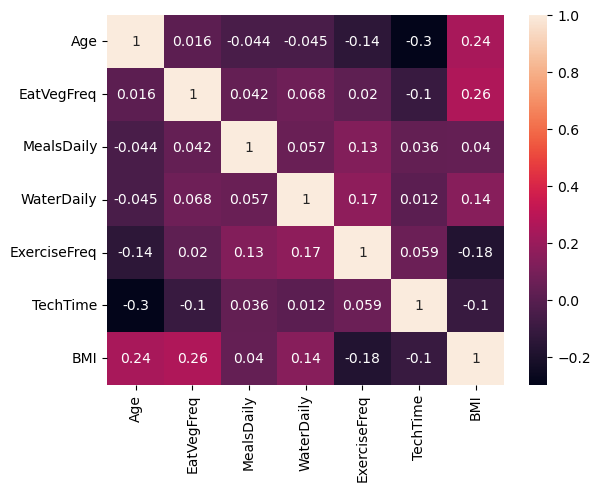

In [16]:
# Correlation Analysis
num_col = list()

for column in df_Eng:
    if df_Eng[column].dtype != "object":
        num_col.append(column)

num_df = df_Eng[num_col]

correl = num_df.corr()
display(correl)

# Use a seaborn heatmap to see this better
sns.heatmap(correl, annot = True)
plt.show()

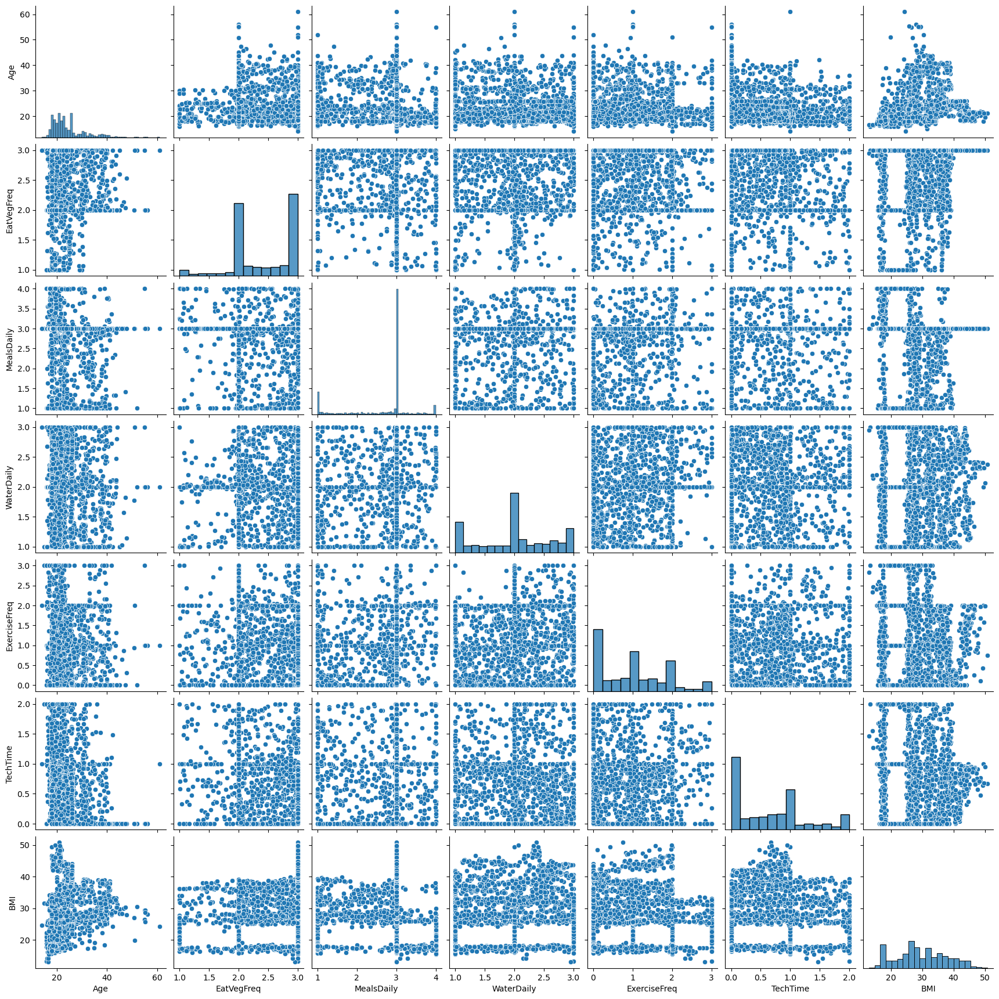

In [17]:
# Pairplot analysis
sns.pairplot(df_Eng)
plt.show()

As observed, there is not really a strong correlation between the BMI and any other numeric attribute except for Age and Eat Veg Frequency.

So the next important thing is to make sure the BMI has a tight correlation with the NObeyesdad readings.

In [19]:
# Sort for easier plotting
sortedDF_BMItoNOB = df_Eng.sort_values(by = ["BMI", "NObeyesdad"], ascending = True)
display(sortedDF_BMItoNOB.head())

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,MealsDaily,Snack?,Smoke?,WaterDaily,WatchCal?,ExerciseFreq,TechTime,Alcohol?,Commute?,BMI,NObeyesdad
627,Female,16.611837,no,yes,2.945967,3.000000,Sometimes,no,2.953192,no,2.830911,1.466667,Sometimes,Public_Transportation,13.00,Insufficient_Weight
302,Male,16.000000,yes,yes,3.000000,3.000000,Always,no,3.000000,no,3.000000,2.000000,Sometimes,Walking,13.29,Insufficient_Weight
698,Female,16.613108,no,yes,2.911877,3.098399,Sometimes,no,2.196405,no,2.328147,1.550110,Sometimes,Public_Transportation,14.16,Insufficient_Weight
563,Female,16.270434,no,yes,3.000000,3.286431,Sometimes,no,2.148146,no,2.458237,1.273333,Sometimes,Public_Transportation,14.25,Insufficient_Weight
330,Female,17.000000,no,yes,3.000000,4.000000,Frequently,no,1.000000,no,2.000000,1.000000,Sometimes,Public_Transportation,15.43,Insufficient_Weight


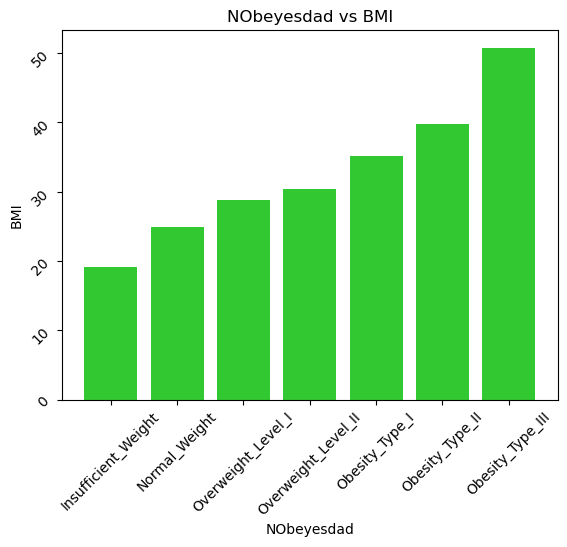

In [20]:
# Bar / Column plot - using PyPlot
plt.bar(sortedDF_BMItoNOB["NObeyesdad"], sortedDF_BMItoNOB["BMI"], color = "#32c832");
plt.title("NObeyesdad vs BMI")
plt.xticks(rotation = 45)
plt.yticks(rotation = 45)
plt.xlabel("NObeyesdad")
plt.ylabel("BMI")
plt.show()

In [21]:
# Find highest BMI for each NObeyesdad (Weight Class)
sortedDF_BMItoNOB.groupby("NObeyesdad")["BMI"].max()

NObeyesdad
Insufficient_Weight    19.08
Normal_Weight          24.91
Obesity_Type_I         35.17
Obesity_Type_II        39.79
Obesity_Type_III       50.81
Overweight_Level_I     28.77
Overweight_Level_II    30.36
Name: BMI, dtype: float64

With the above, I can put the Weight Class into these categories in relation to BMI:
<ul>
<li>< 20 - Insufficient_Weight</li>
<li>20 to 25 - Normal_Weight</li>
<li>> 25 to 29 - Overweight_Level_I</li>
<li>> 29 to 33 - Overweight_Level_II</li>
<li>> 33 to 37 - Obesity_Level_I</li>
<li>> 37 to 40 - Obesity_Level_II</li>
<li>> 40 - Obesity_Level_III</li>
</ul>

So it is apparent that NObeyesdad is similar with the BMI - they have no consideration of bodyfat percentage.
Such attributes would assume that no one is exceptionally "skinny-fat" or extra muscular.

However, I think we can still play along since there are still so many non-numeric attributes.
Even though Eat Veg Frequency has a hotter correlation with BMI in the Heat Map, I have chosen to use the Age as an accompanying and uncontrollable attribute for a more natural distribution. Sad to say, it is also telling that morbidly obese individuals tend to have a higher mortality rate...

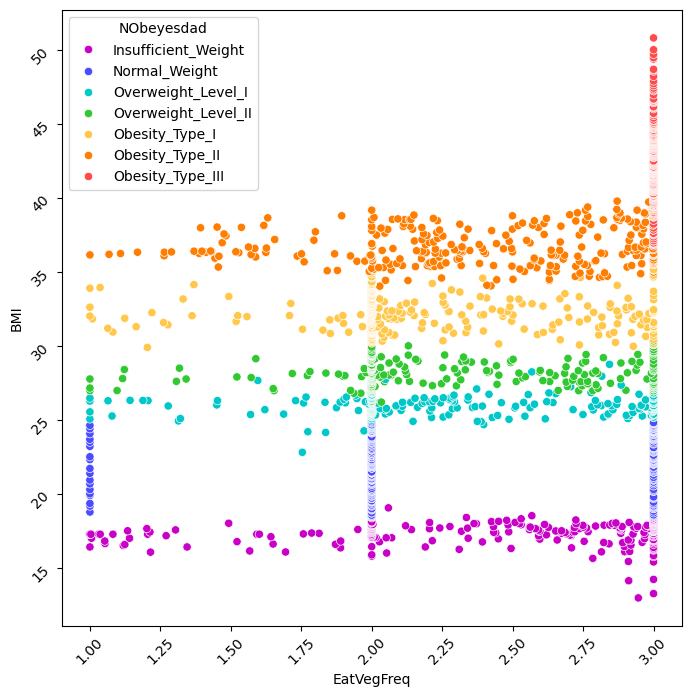

In [23]:
# Let's start with a numeric value which is not used for the rest of the plotting - Eat Veg Frequency
plt.figure(figsize = (8, 8))
snsPlot = sns.scatterplot(data = sortedDF_BMItoNOB, x = "EatVegFreq", y = "BMI", hue = "NObeyesdad",
                          palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

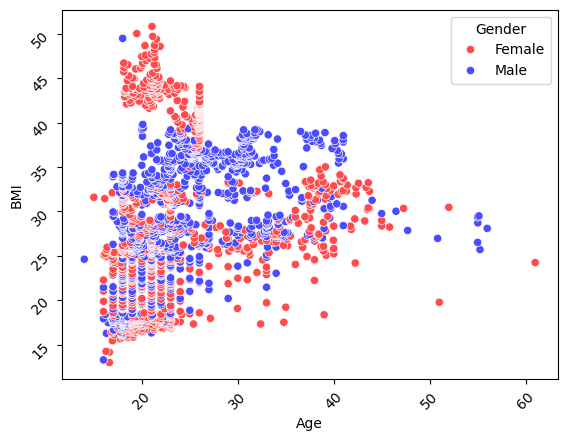

In [24]:
# Initial Scatterplot (for non-quantitative values - Gender Distribution)
snsPlot = sns.scatterplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "Gender", palette = ["#ff4b4b", "#4b4bff"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

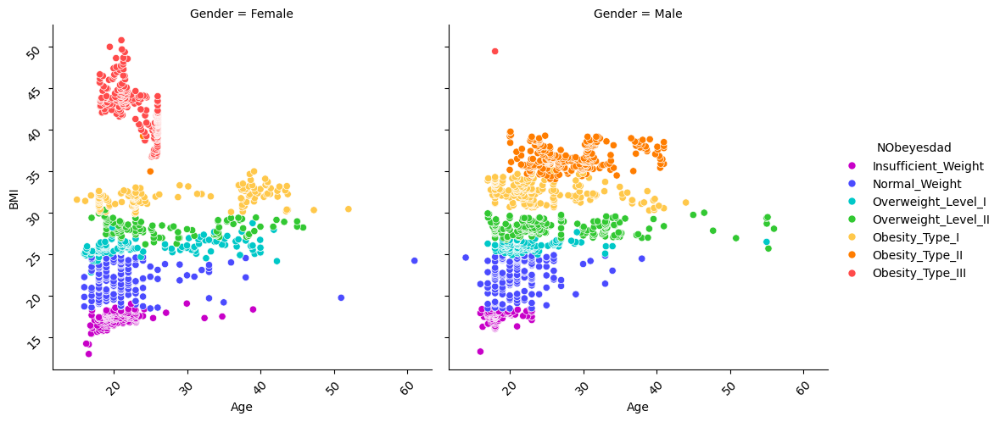

In [25]:
# Scatterplot (for non-quantitative values - Gender)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "Gender",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

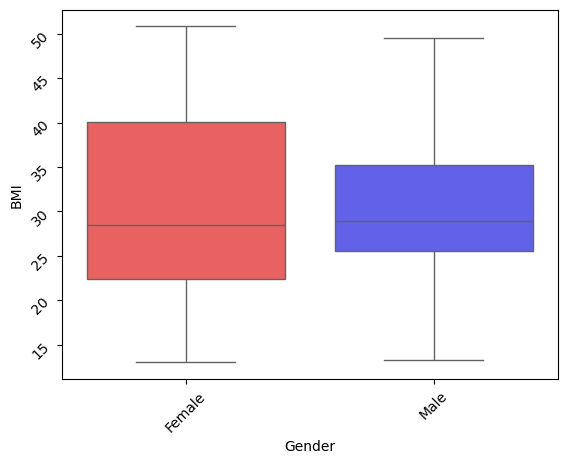

In [26]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "Gender", y = "BMI", hue = "Gender", palette = ["#ff4b4b", "#4b4bff"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

In [27]:
# Printing this is just to prove the data isn't biased...
df_Gender = sortedDF_BMItoNOB.groupby(["Gender"]).size()
display(df_Gender)

Gender
Female    1043
Male      1068
dtype: int64

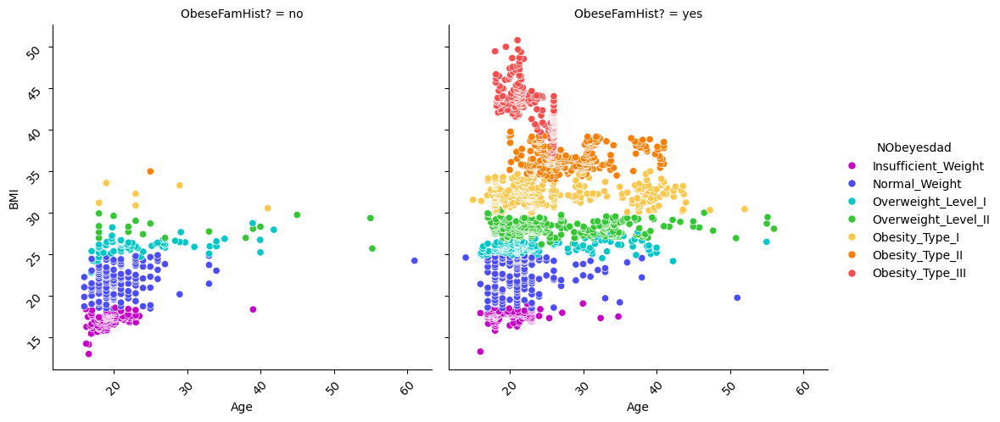

In [28]:
# Scatterplot (for non-quantitative values - Obese Family History?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "ObeseFamHist?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

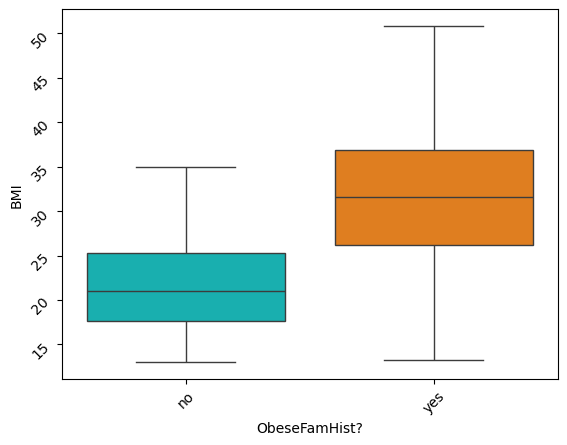

In [29]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "ObeseFamHist?", y = "BMI", hue = "ObeseFamHist?", palette = ["#00c8c8", "#ff7d00"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

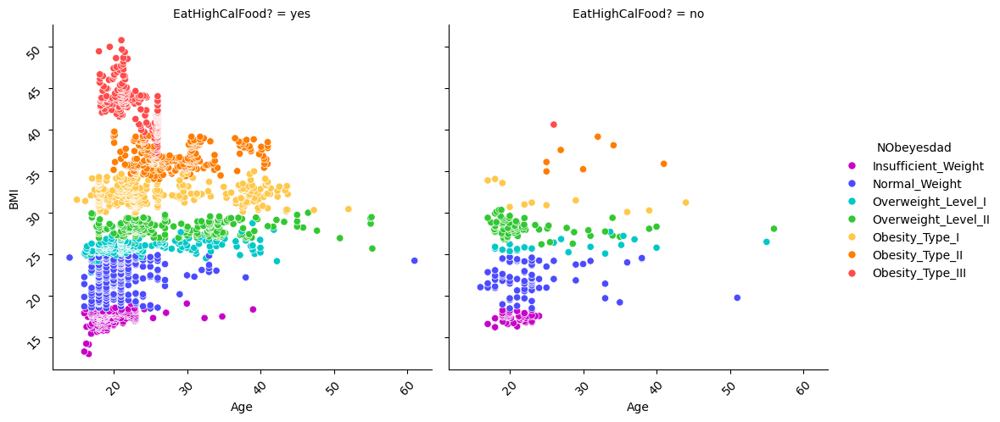

In [30]:
# Scatterplot (for non-quantitative values - Eat High Caloric Food?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "EatHighCalFood?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

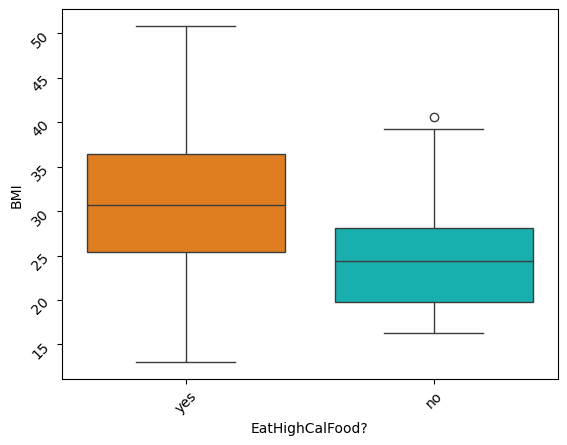

In [31]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "EatHighCalFood?", y = "BMI", hue = "EatHighCalFood?", palette = ["#ff7d00", "#00c8c8"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

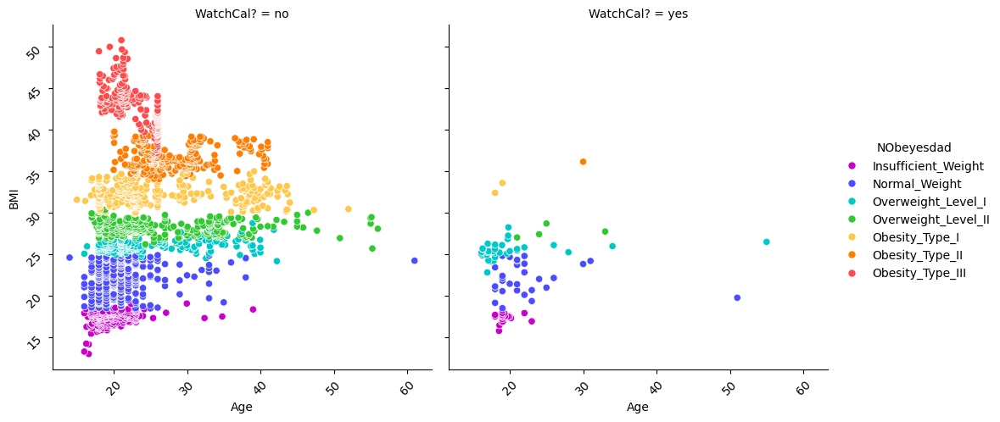

In [32]:
# Scatterplot (for non-quantitative values - Watch Caloric Intake?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "WatchCal?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

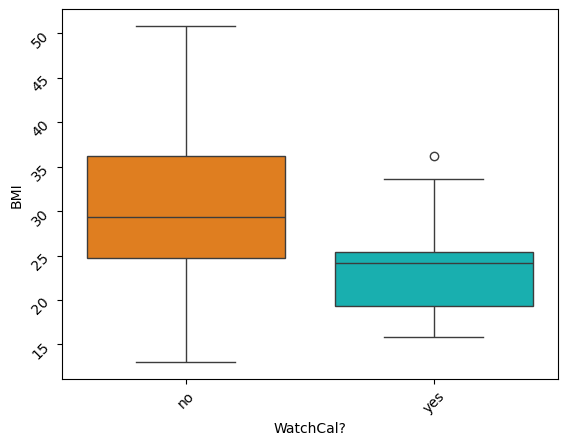

In [33]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "WatchCal?", y = "BMI", hue = "WatchCal?", palette = ["#ff7d00", "#00c8c8"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

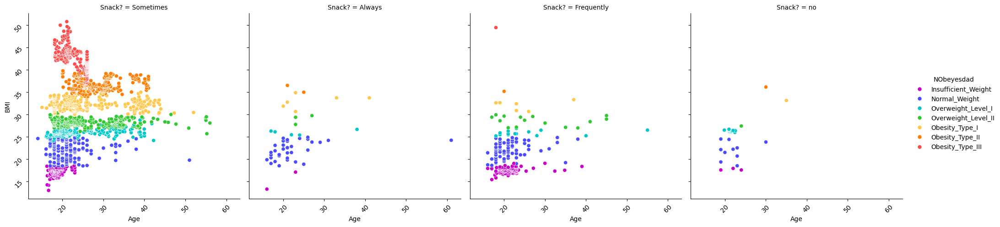

In [34]:
# Scatterplot (for non-quantitative values - Snacking Habit?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "Snack?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

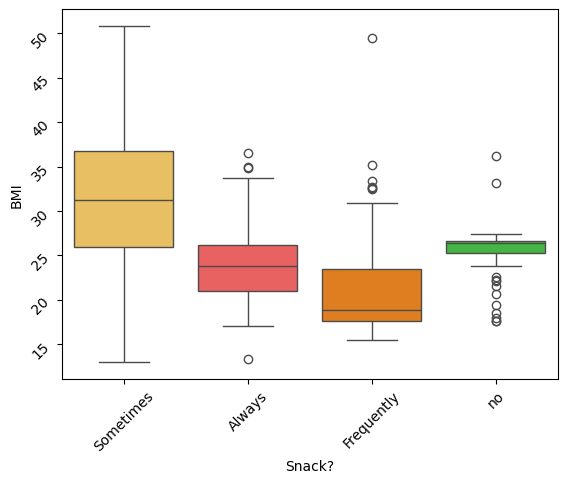

In [35]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "Snack?", y = "BMI", hue = "Snack?", palette = ["#ffc84b", "#ff4b4b", "#ff7d00", "#32c832"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

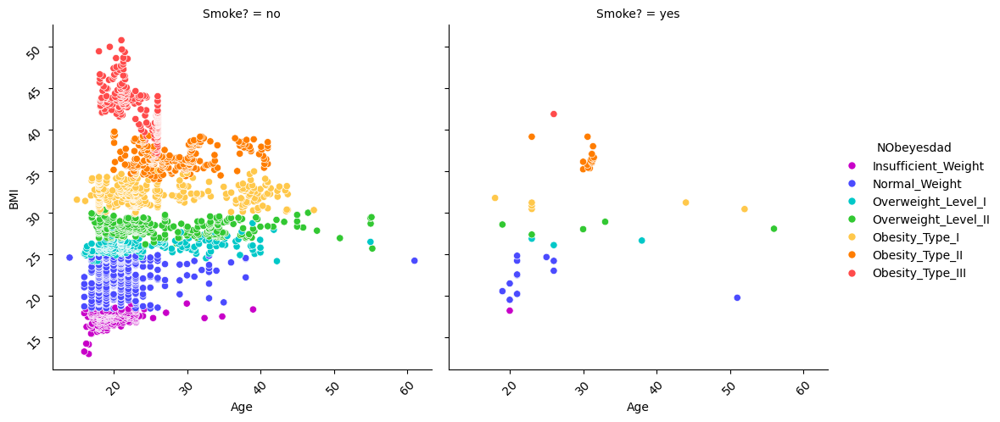

In [36]:
# Scatterplot (for non-quantitative values - Smoking Habit?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "Smoke?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

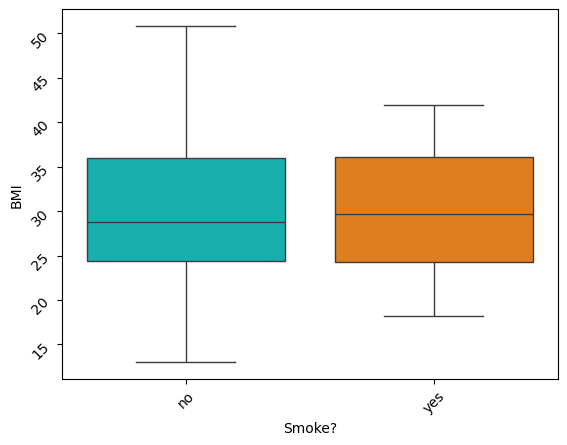

In [37]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "Smoke?", y = "BMI", hue = "Smoke?", palette = ["#00c8c8", "#ff7d00"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

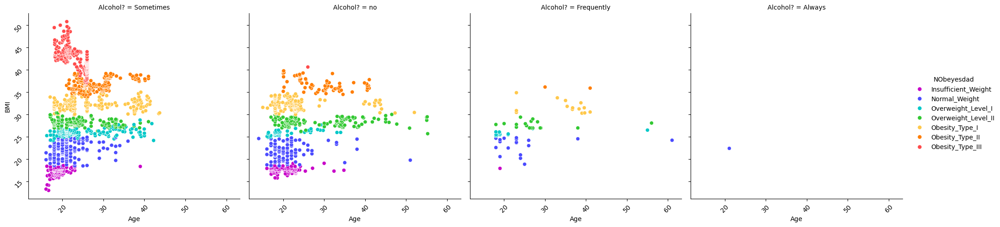

In [38]:
# Scatterplot (for non-quantitative values - Drinking Habit?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "Alcohol?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

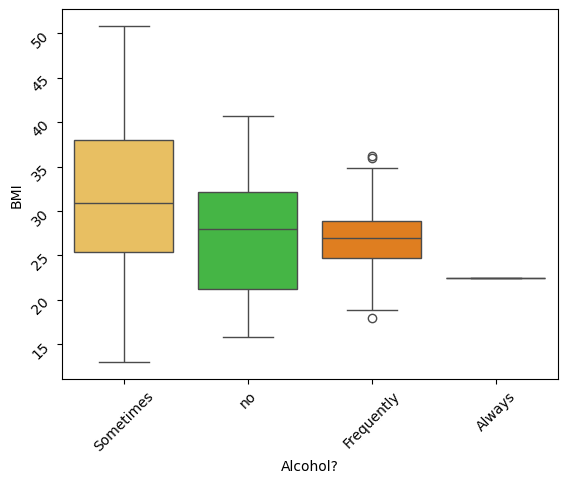

In [39]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "Alcohol?", y = "BMI", hue = "Alcohol?", palette = ["#ffc84b", "#32c832", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

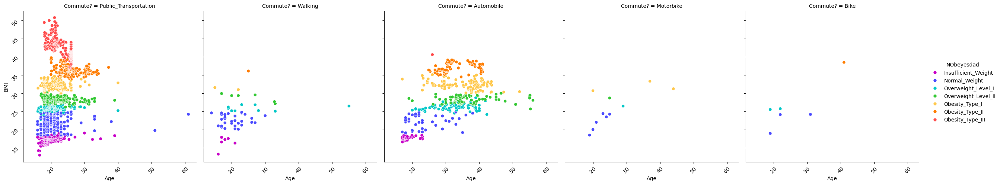

In [40]:
# Scatterplot (for non-quantitative values - Mode of Transport?)
snsPlot = sns.relplot(data = sortedDF_BMItoNOB, x = "Age", y = "BMI", hue = "NObeyesdad", col = "Commute?",
                      palette = ["#c800c8", "#4b4bff", "#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

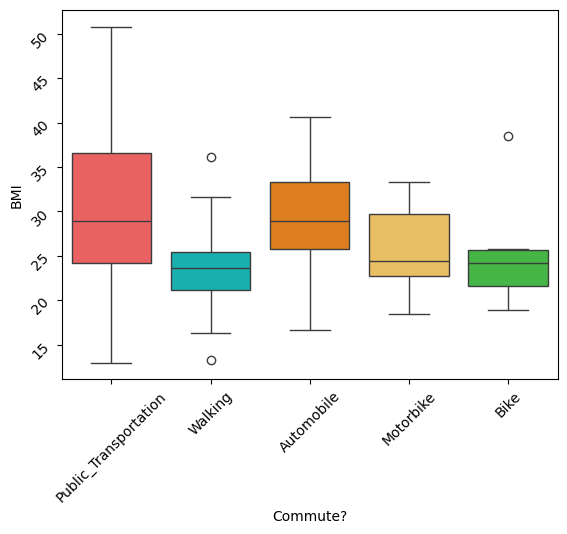

In [41]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = sortedDF_BMItoNOB, x = "Commute?", y = "BMI",
                      hue = "Commute?", palette = ["#ff4b4b", "#00c8c8", "#ff7d00", "#ffc84b", "#32c832"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

At this point, we’ve noticed the attributes affect the converging coverage of BMI range instead of clear differentiation, which heavily affects my choice of ML methods.


**Data Critique Phase**

A quick Google Search gives me a rough idea that the macronutrients taken by common people in the listed countries aren't too different from us in Singapore, following the old food pyramid with carbohydrates being the main base.

I don't think I want to dive into the kind of alcohol being commonly taken among these countries. Too many variations just by looking at Aguardiente alone...

Reference:
https://en.wikipedia.org/wiki/Aguardiente

The next question is how are the public transports in these three countries? I have to ask Google and Gemini.

Google Search Results:
<ol>
<li>In Colombia, buses are king and they cover virtually every area of the country.</li>
<li>Buses are Peru's main method of getting between cities</li>
<li>Mexico City has a vast metro and bus network.</li>
</ol>

Confirmation from this website (TomTom Traffic Index): https://www.tomtom.com/traffic-index/ranking/

These values should be for car owners.

Full Ranking 2023 (City Center):
<ul>
<li>Lima - Peru: 5th (Avg Travel Time per 10km: 28min 10s)</li>
<li>Mexico City - Mexico: 13th (Avg Travel Time per 10km: 26min 30s)</li>
<li>Bogota - Colombia: 19th (Avg Travel Time per 10km: 25min 30s)</li>
</ul>

Full Ranking 2023 (Metro Area):
<ul>
<li>Lima - Peru: 2nd (Avg Travel Time per 10km: 24min 20s)</li>
<li>Bogota - Colombia: 5th (Avg Travel Time per 10km: 23min 30s)</li>
<li>Mexico City - Mexico: 21th (Avg Travel Time per 10km: 20min 10s)</li>
</ul>

My personal hypothesis is that those who commute by walking or riding are working nearby their residing locations, or vice versa; and those who need to drive or take public transports need to go through the pain of traffic congestion, having the non-car owners suffering the most as the travel would multiply from the stated figures above.

**Further Data Cleaning**

In [49]:
# I think there is a better way to relabel the columns, and also to remove irrelevant attributes.
df_Simple = df_Eng.rename(columns = {
    "Commute?": "CommuteDiff",
    "NObeyesdad": "WeightClass"
})

df_Simple.drop("Snack?", axis = 1, inplace = True)
df_Simple.drop("Alcohol?", axis = 1, inplace = True)
df_Simple.drop("Smoke?", axis = 1, inplace = True)
df_Simple.drop("MealsDaily", axis = 1, inplace = True)
df_Simple.drop("WaterDaily", axis = 1, inplace = True)
df_Simple.drop("ExerciseFreq", axis = 1, inplace = True)
df_Simple.drop("TechTime", axis = 1, inplace = True)

display(df_Simple.head())

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,WatchCal?,CommuteDiff,BMI,WeightClass
0,Female,21.0,yes,no,2.0,no,Public_Transportation,24.39,Normal_Weight
1,Female,21.0,yes,no,3.0,yes,Public_Transportation,24.24,Normal_Weight
2,Male,23.0,yes,no,2.0,no,Public_Transportation,23.77,Normal_Weight
3,Male,27.0,no,no,3.0,no,Walking,26.85,Overweight_Level_I
4,Male,22.0,no,no,2.0,no,Public_Transportation,28.34,Overweight_Level_II


Let's go back to our BMI to Weight Class relation:
<ul>
<li>< 20 - Insufficient_Weight</li>
<li>20 to 25 - Normal_Weight</li>
<li>> 25 to 29 - Overweight_Level_I</li>
<li>> 29 to 33 - Overweight_Level_II</li>
<li>> 33 to 37 - Obesity_Level_I</li>
<li>> 37 to 40 - Obesity_Level_II</li>
<li>> 40 - Obesity_Level_III</li>
</ul>

The objective is to see if there are lifestyle patterns linking to obesity.
As much as possible, the BMI should only serve as a measurement instead of a factoring attribute.

I think it is fair to distribute these BMI ranges into **Normal Weight and below as Low Risk, Overweight as Medium Risk, and Obesity as High Risk.**

In [51]:
# Reduce Weight Groups for Obesity Risk Levels
print("Obesity Risk Levels")
sortedDF_ObRiskLow = df_Simple[(df_Simple["BMI"] <= 25)]
display("Low Risk", sortedDF_ObRiskLow.shape)
sortedDF_ObRiskMed = df_Simple[(df_Simple["BMI"] > 25) & (df_Simple["BMI"] <= 33)]
display("Medium Risk", sortedDF_ObRiskMed.shape)
sortedDF_ObRiskHigh = df_Simple[(df_Simple["BMI"] > 33)]
display("High Risk", sortedDF_ObRiskHigh.shape)

Obesity Risk Levels


'Low Risk'

(572, 9)

'Medium Risk'

(833, 9)

'High Risk'

(706, 9)

In [52]:
# Adding an Age Group & Obesity Risk columns
all_ObRisk = [] # Declare list for Obesity Risk

for i in range(len(df_Simple)):
    if df_Simple["BMI"][i] <= 25:
        all_ObRisk.append("Low")
    elif (df_Simple["BMI"][i] > 25) & (df_Simple["BMI"][i] <= 33):
        all_ObRisk.append("Med")
    else:
        all_ObRisk.append("High")

df_Simple.insert(8, "ObeseRisk", all_ObRisk)  # Insert the column into the DataFrame

display(df_Simple)

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,WatchCal?,CommuteDiff,BMI,ObeseRisk,WeightClass
0,Female,21.000000,yes,no,2.0,no,Public_Transportation,24.39,Low,Normal_Weight
1,Female,21.000000,yes,no,3.0,yes,Public_Transportation,24.24,Low,Normal_Weight
2,Male,23.000000,yes,no,2.0,no,Public_Transportation,23.77,Low,Normal_Weight
3,Male,27.000000,no,no,3.0,no,Walking,26.85,Med,Overweight_Level_I
4,Male,22.000000,no,no,2.0,no,Public_Transportation,28.34,Med,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,yes,yes,3.0,no,Public_Transportation,44.90,High,Obesity_Type_III
2107,Female,21.982942,yes,yes,3.0,no,Public_Transportation,43.74,High,Obesity_Type_III
2108,Female,22.524036,yes,yes,3.0,no,Public_Transportation,43.54,High,Obesity_Type_III
2109,Female,24.361936,yes,yes,3.0,no,Public_Transportation,44.07,High,Obesity_Type_III


In [53]:
# Encoding Data (from String to Numerals)
df_Simple["Gender"] = df_Simple["Gender"].replace(["Female", "Male"], [0, 1])
df_Simple["ObeseFamHist?"] = df_Simple["ObeseFamHist?"].replace(["no", "yes"], [0, 1])
df_Simple["EatHighCalFood?"] = df_Simple["EatHighCalFood?"].replace(["no", "yes"], [0, 1])
df_Simple["WatchCal?"] = df_Simple["WatchCal?"].replace(["no", "yes"], [0, 1])
df_Simple["CommuteDiff"] = df_Simple["CommuteDiff"].replace(["Walking", "Bike", "Motorbike", "Automobile", "Public_Transportation"],
                                                            [0, 1, 2, 3, 4])
df_Simple["ObeseRisk"] = df_Simple["ObeseRisk"].replace(["Low", "Med", "High"],
                                                            [0, 1, 2])

display(df_Simple.head())

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,WatchCal?,CommuteDiff,BMI,ObeseRisk,WeightClass
0,0,21.0,1,0,2.0,0,4,24.39,0,Normal_Weight
1,0,21.0,1,0,3.0,1,4,24.24,0,Normal_Weight
2,1,23.0,1,0,2.0,0,4,23.77,0,Normal_Weight
3,1,27.0,0,0,3.0,0,0,26.85,1,Overweight_Level_I
4,1,22.0,0,0,2.0,0,4,28.34,1,Overweight_Level_II


In [54]:
# Need to confirm change of datatype to feed into correlation...
display(df_Simple.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Gender           2111 non-null   int64  
 1   Age              2111 non-null   float64
 2   ObeseFamHist?    2111 non-null   int64  
 3   EatHighCalFood?  2111 non-null   int64  
 4   EatVegFreq       2111 non-null   float64
 5   WatchCal?        2111 non-null   int64  
 6   CommuteDiff      2111 non-null   int64  
 7   BMI              2111 non-null   float64
 8   ObeseRisk        2111 non-null   int64  
 9   WeightClass      2111 non-null   object 
dtypes: float64(3), int64(6), object(1)
memory usage: 165.1+ KB


None

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,WatchCal?,CommuteDiff,BMI,ObeseRisk
Gender,1.000000,0.048394,0.102512,0.064934,-0.274505,-0.102633,-0.129704,-0.053038,0.057677
Age,0.048394,1.000000,0.205725,0.063902,0.016291,-0.116283,-0.279891,0.244149,0.288757
ObeseFamHist?,0.102512,0.205725,1.000000,0.208036,0.040372,-0.185422,0.016124,0.483511,0.483172
EatHighCalFood?,0.064934,0.063902,0.208036,1.000000,-0.027283,-0.190658,0.146358,0.246094,0.256614
EatVegFreq,-0.274505,0.016291,0.040372,-0.027283,1.000000,0.071852,0.029537,0.263649,0.192778
WatchCal?,-0.102633,-0.116283,-0.185422,-0.190658,0.071852,1.000000,-0.033238,-0.184280,-0.184987
CommuteDiff,-0.129704,-0.279891,0.016124,0.146358,0.029537,-0.033238,1.000000,0.138047,0.145903
BMI,-0.053038,0.244149,0.483511,0.246094,0.263649,-0.184280,0.138047,1.000000,0.924825
ObeseRisk,0.057677,0.288757,0.483172,0.256614,0.192778,-0.184987,0.145903,0.924825,1.000000


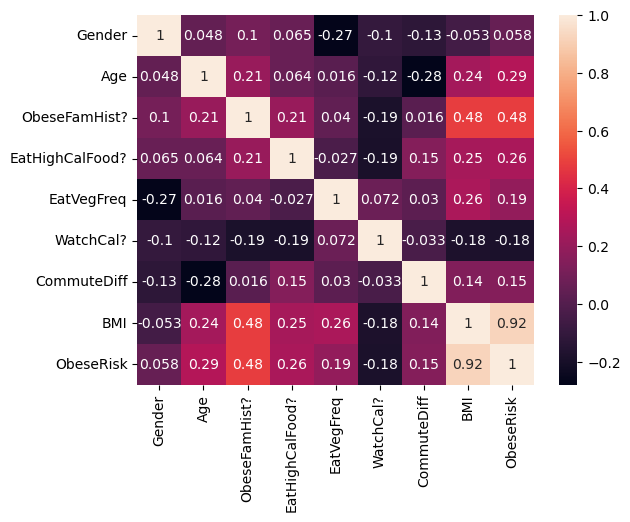

In [55]:
# Correlation Analysis
num_col = list()

for column in df_Simple:
    if df_Simple[column].dtype != "object":
        num_col.append(column)

num_df = df_Simple[num_col]

correl = num_df.corr()
display(correl)

# Use a seaborn heatmap to see this better
sns.heatmap(correl, annot = True)
plt.show()

At this point, the Pairplot analysis would not be very meaningful since most of these attributes are converted from classifications... 

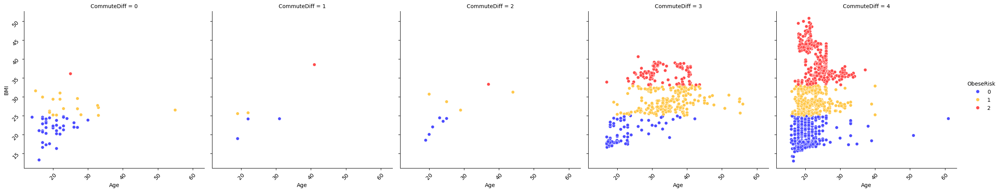

In [57]:
# Scatterplot (for non-quantitative values - Commute Difficulty)
snsPlot = sns.relplot(data = df_Simple, x = "Age", y = "BMI", hue = "ObeseRisk", col = "CommuteDiff",
                      palette = ["#4b4bff", "#ffc84b", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

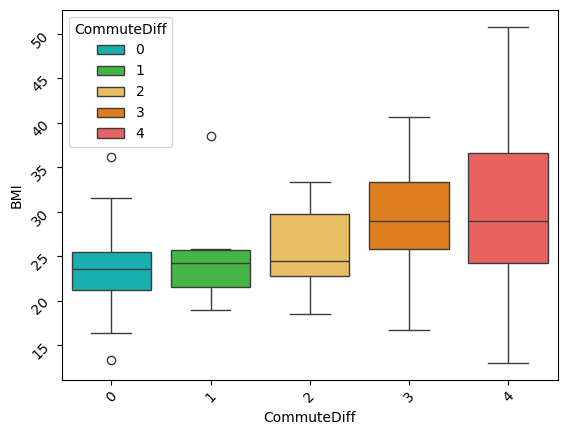

In [58]:
# Boxplot distribution and outliers...
snsPlot = sns.boxplot(data = df_Simple, x = "CommuteDiff", y = "BMI",
                      hue = "CommuteDiff", palette = ["#00c8c8", "#32c832", "#ffc84b", "#ff7d00", "#ff4b4b"])
snsPlot.tick_params(axis='x', rotation = 45)
snsPlot.tick_params(axis='y', rotation = 45)
plt.show()

In [59]:
# At this point, the Watch Calories Attribute does not seem to serve a purpose since the correlation is just too low...
df_Simple.drop("WatchCal?", axis = 1, inplace = True)

display(df_Simple.head())

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,CommuteDiff,BMI,ObeseRisk,WeightClass
0,0,21.0,1,0,2.0,4,24.39,0,Normal_Weight
1,0,21.0,1,0,3.0,4,24.24,0,Normal_Weight
2,1,23.0,1,0,2.0,4,23.77,0,Normal_Weight
3,1,27.0,0,0,3.0,0,26.85,1,Overweight_Level_I
4,1,22.0,0,0,2.0,4,28.34,1,Overweight_Level_II


,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,CommuteDiff,BMI,ObeseRisk
Gender,1.000000,0.048394,0.102512,0.064934,-0.274505,-0.129704,-0.053038,0.057677
Age,0.048394,1.000000,0.205725,0.063902,0.016291,-0.279891,0.244149,0.288757
ObeseFamHist?,0.102512,0.205725,1.000000,0.208036,0.040372,0.016124,0.483511,0.483172
EatHighCalFood?,0.064934,0.063902,0.208036,1.000000,-0.027283,0.146358,0.246094,0.256614
EatVegFreq,-0.274505,0.016291,0.040372,-0.027283,1.000000,0.029537,0.263649,0.192778
CommuteDiff,-0.129704,-0.279891,0.016124,0.146358,0.029537,1.000000,0.138047,0.145903
BMI,-0.053038,0.244149,0.483511,0.246094,0.263649,0.138047,1.000000,0.924825
ObeseRisk,0.057677,0.288757,0.483172,0.256614,0.192778,0.145903,0.924825,1.000000


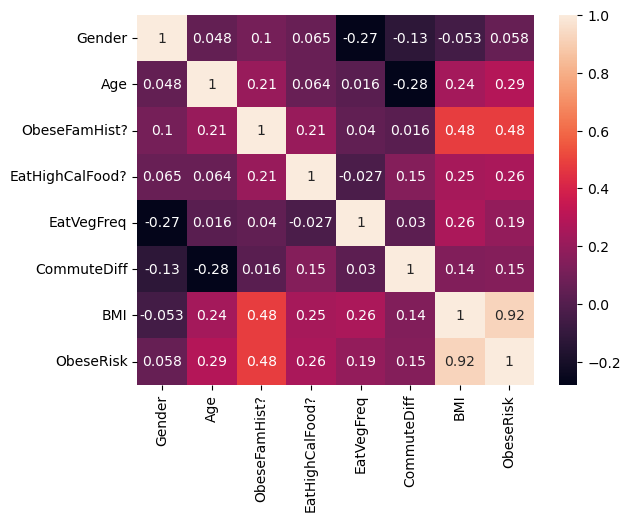

In [60]:
# Correlation Analysis
num_col = list()

for column in df_Simple:
    if df_Simple[column].dtype != "object":
        num_col.append(column)

num_df = df_Simple[num_col]

correl = num_df.corr()
display(correl)

# Use a seaborn heatmap to see this better
sns.heatmap(correl, annot = True)
plt.show()

**Machine Learning Phase**

I may want to explore into a Decision Tree Classifier, but I feel that I should go with Unsupervised Clustering via k-Means first.

**Unsupervised Machine Learning - Clustering (via k-Means)**

In [64]:
# Importing machine learning libraries
from sklearn.cluster import KMeans
import plotly.express as px

print("Libraries imported successfully!")

Libraries imported successfully!


In [65]:
# Since I am trying 2 different paths of Machine Learning, I should create another instance of the prepped-up Simplified DF.
# I should still retain BMI for plotting purpose...
df_SimpKmeans = df_Simple.drop("WeightClass", axis = 1)
df_SimpKmeans.drop("ObeseRisk", axis = 1, inplace = True) # As clustering would generate its own cluster label

display(df_SimpKmeans)

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,CommuteDiff,BMI
0,0,21.000000,1,0,2.0,4,24.39
1,0,21.000000,1,0,3.0,4,24.24
2,1,23.000000,1,0,2.0,4,23.77
3,1,27.000000,0,0,3.0,0,26.85
4,1,22.000000,0,0,2.0,4,28.34
...,...,...,...,...,...,...,...
2106,0,20.976842,1,1,3.0,4,44.90
2107,0,21.982942,1,1,3.0,4,43.74
2108,0,22.524036,1,1,3.0,4,43.54
2109,0,24.361936,1,1,3.0,4,44.07


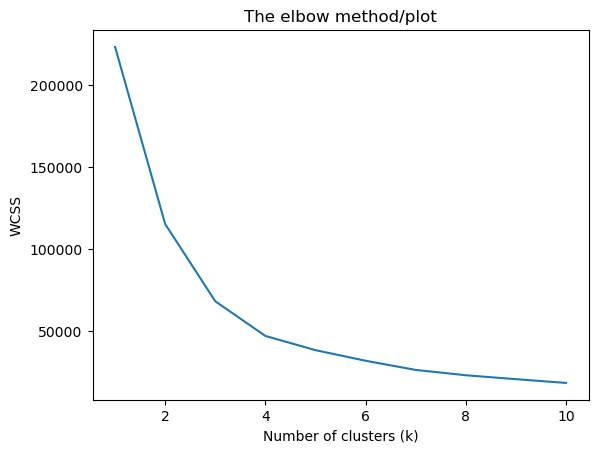

In [66]:
# WCSS - Plot the elbow plot (Numeric Attributes only)
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i)
    kmeans.fit(df_SimpKmeans) # train the algorithm with the input data
    wcss.append(kmeans.inertia_) # WCSS is also called inertia
    
# Plot the results on a line chart
# Allow us to observe the elbow
plt.plot(range(1,11), wcss)
plt.title('The elbow method/plot')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.show()

In [67]:
# We have decided on a k value = 3
kmeans = KMeans(n_clusters = 3) # Mainly identifying "Low Risk", "Medium Risk" or "High Risk"
kmeans_model = kmeans.fit(df_SimpKmeans) # Training the model on input data
cluster_labels = kmeans.labels_

display(cluster_labels)

array([1, 1, 1, ..., 0, 0, 0])

In [68]:
# Adding cluster labels back to Dataset
df_SimpKmeans["ObeseRisk2"] = cluster_labels

display(df_SimpKmeans)

,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,CommuteDiff,BMI,ObeseRisk2
0,0,21.000000,1,0,2.0,4,24.39,1
1,0,21.000000,1,0,3.0,4,24.24,1
2,1,23.000000,1,0,2.0,4,23.77,1
3,1,27.000000,0,0,3.0,0,26.85,1
4,1,22.000000,0,0,2.0,4,28.34,1
...,...,...,...,...,...,...,...,...
2106,0,20.976842,1,1,3.0,4,44.90,0
2107,0,21.982942,1,1,3.0,4,43.74,0
2108,0,22.524036,1,1,3.0,4,43.54,0
2109,0,24.361936,1,1,3.0,4,44.07,0


,Gender,Age,ObeseFamHist?,EatHighCalFood?,EatVegFreq,CommuteDiff,BMI,ObeseRisk2
Gender,1.000000,0.048394,0.102512,0.064934,-0.274505,-0.129704,-0.053038,-0.002092
Age,0.048394,1.000000,0.205725,0.063902,0.016291,-0.279891,0.244149,0.430780
ObeseFamHist?,0.102512,0.205725,1.000000,0.208036,0.040372,0.016124,0.483511,-0.202030
EatHighCalFood?,0.064934,0.063902,0.208036,1.000000,-0.027283,0.146358,0.246094,-0.174942
EatVegFreq,-0.274505,0.016291,0.040372,-0.027283,1.000000,0.029537,0.263649,-0.168762
CommuteDiff,-0.129704,-0.279891,0.016124,0.146358,0.029537,1.000000,0.138047,-0.328469
BMI,-0.053038,0.244149,0.483511,0.246094,0.263649,0.138047,1.000000,-0.552340
ObeseRisk2,-0.002092,0.430780,-0.202030,-0.174942,-0.168762,-0.328469,-0.552340,1.000000


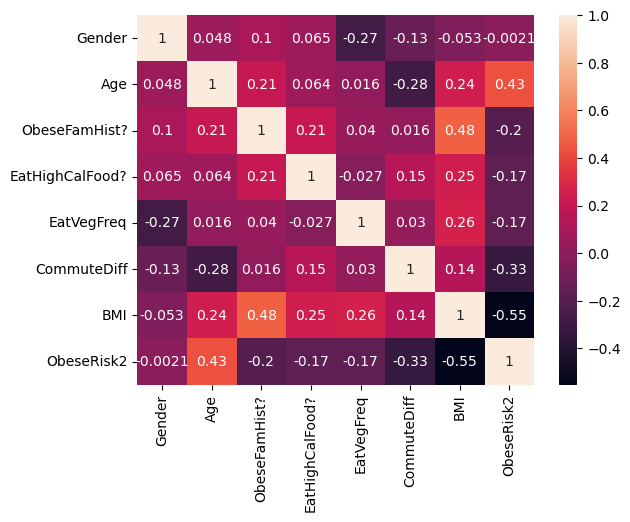

In [69]:
# Correlation Analysis
num_col = list()

for column in df_SimpKmeans:
    if df_SimpKmeans[column].dtype != "object":
        num_col.append(column)

num_df = df_SimpKmeans[num_col]

correl = num_df.corr()
display(correl)

# Use a seaborn heatmap to see this better
sns.heatmap(correl, annot = True)
plt.show()

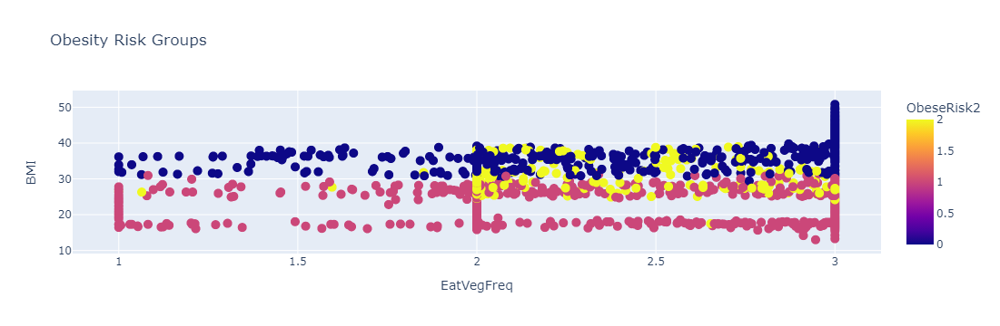

In [70]:
# Plotly visualization - 2D
fig = px.scatter(df_SimpKmeans, x = df_SimpKmeans["EatVegFreq"], y = df_SimpKmeans["BMI"], color = "ObeseRisk2", title = "Obesity Risk Groups")
fig.update_traces(marker = dict(size = 10))  # Adjust marker size (optional)
fig.show()

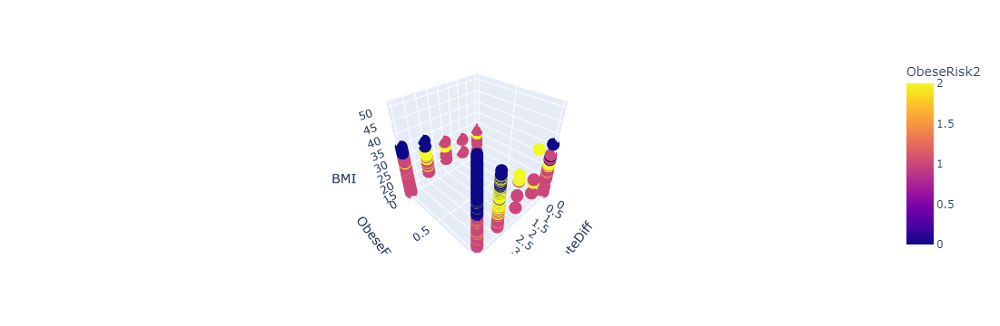

In [71]:
# Plotly visualization - 3D
fig = px.scatter_3d(df_SimpKmeans, x = "CommuteDiff", y = "ObeseFamHist?", z = "BMI", color = 'ObeseRisk2')
fig.show()

In [72]:
# Import library for silhouette score
from sklearn.metrics import silhouette_score

print("Libraries imported successfully!")

Libraries imported successfully!


In [73]:
# Calculate the silhouette score
sil_score = silhouette_score(num_df, cluster_labels)
print(f"Silhouette Score for k = 3: {sil_score}")

Silhouette Score for k = 3: 0.49465198429877894


It is observably understandable for the low silhouette score due to the visible overlapping or points...

**Supervised Machine Learning - Classification (via Decision Tree)**

In [76]:
# Import SKLearn Modules (Supervised ML)
from sklearn.model_selection import train_test_split
from sklearn import metrics

# Import the Decision Tree Classifier Model
from sklearn import tree

print("Libraries imported successfully!")

Libraries imported successfully!


In [77]:
# Define input and target attributes (in correlation order to Obesity Risk)
X = df_Simple[["ObeseFamHist?", "Age", "EatHighCalFood?", "EatVegFreq", "CommuteDiff", "Gender"]]
y = df_Simple.ObeseRisk

# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 0)

display("Train Shape",X_train.shape)
display("Test Shape",X_test.shape)

'Train Shape'

(1688, 6)

'Test Shape'

(423, 6)

In [78]:
# Printing the total counts of unique values in the Y_train
print("Training:")
print(y_train.value_counts())

# Let's divide these values by 1168 (total rows in training data) to get percentage.
display((y_train.value_counts() / 1168) * 100)  # Multiply with 100 to get percentage

print("")

# Printing the total counts of unique values in the Y_test
print("Testing:")
print(y_test.value_counts())

# Let's divide these values by 38 (total rows in testing data) to get percentage.
display((y_test.value_counts() / 423) * 100)  # Multiply with 100 to get percentage

Training:
ObeseRisk
1    674
2    569
0    445
Name: count, dtype: int64


ObeseRisk
1    57.705479
2    48.715753
0    38.099315
Name: count, dtype: float64


Testing:
ObeseRisk
1    159
2    137
0    127
Name: count, dtype: int64


ObeseRisk
1    37.588652
2    32.387707
0    30.023641
Name: count, dtype: float64

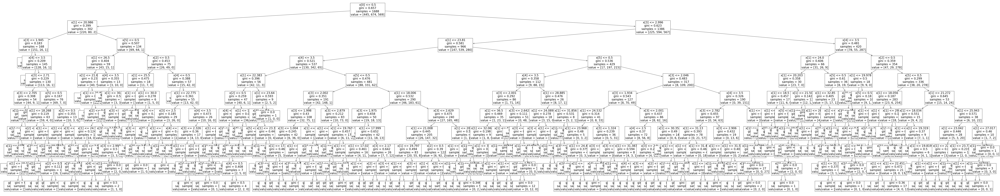

In [79]:
# Decision Tree Fitting
clf = tree.DecisionTreeClassifier(max_depth = 10, random_state = 0)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Render Decision Tree
plt.figure(figsize = (125, 25))
tree.plot_tree(clf, fontsize = 20);

In [80]:
# Calculate Performance Score
treeAccuracy = metrics.accuracy_score(y_pred, y_test)

print("The accuracy of Decision Tree model is:", treeAccuracy * 100, "%")

The accuracy of Decision Tree model is: 77.54137115839244 %


The performance accuracy is to be expected as the measurement of risk towards obesity is based on stereotypical factors:<br>
**Gender, Age, Obese Family History, Consumption of High Caloric Food, Eat Veg Frequency, and Commute Difficulty.** <br>
It is more so difficult as the attributes affect the range coverage of risks instead of clear cut differentiation.

Over all, the Decision Tree Classifier serves better for the purpose. Having over 3/4 accuracy is considered okay,
and we have certainly identified what are some of the main factors to look out for in terms of obesity.

**Conclusion**

It would have been more accurate with Weight and Height, and eventually derive the BMI,
but that would defeat the purpose if the main focus is to predict obesity risk based on biology and lifestyle.
Looking at current state of individuals is not the direction of the study.

Still, mode of commute can be a great oversight in many medical studies, and even more so in a small country like Singapore.
The "Little Red Dot" might have overlooked this factor due to a relative lack of distance in terms of land area.

Structure of data observation can drastically change with some of the lacking data in place as mentioned in the data critique.